# Image Dataset Clustering

Created by Paul Scott<br>
MSE Computer and Information Science<br>
University of Pennsylvania<br>

# Setup

### Imports

In [2]:
import os
import shutil
from collections import Counter
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras import models, layers, preprocessing
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

### Helper Functions

In [3]:
def display_image_grid(images, labels=None):
  assert labels == None or len(images) == len(labels)
  fig = plt.figure(figsize=(12, 12))
  for i in range(len(images)):
    grid_size = int(np.ceil(np.sqrt(len(images))))
    fig.add_subplot(grid_size, grid_size, i + 1)
    if labels:
      plt.title(labels[i])
    plt.imshow(images[i])
    plt.axis('off')

# Load Dataset

### Load and Normalize Dataset

In [39]:
dataset_name = 'roman_coins'
dataset_dir = f'input_images/{dataset_name}'

batch_size = 16
img_dim = 128
channels = 3
img_shape = (img_dim, img_dim, channels)

datagen = preprocessing.image.ImageDataGenerator(rescale=1/255.0)

dataset = datagen.flow_from_directory(
  dataset_dir,
  target_size=(img_dim, img_dim),
  class_mode='input',
  batch_size=batch_size,
  interpolation='box',
)

Found 82135 images belonging to 1 classes.


### Display Images From Dataset

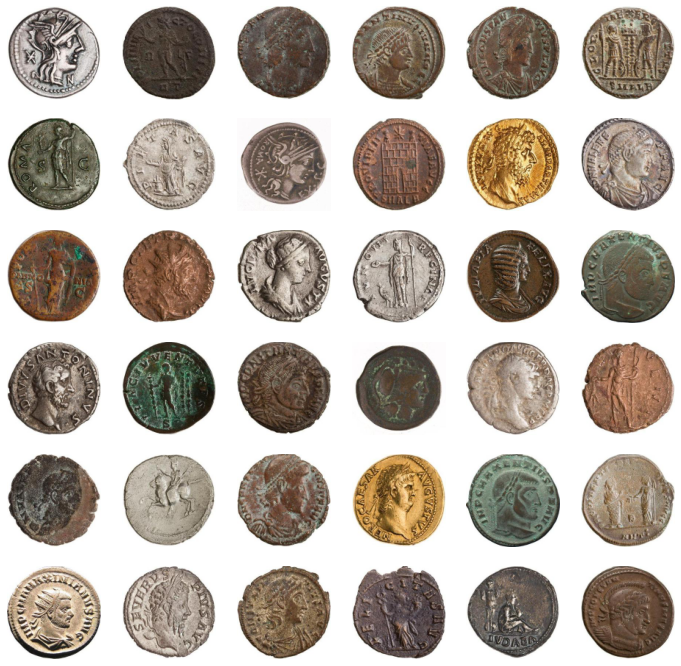

In [40]:
num_examples = 36

images = []
while len(images) < num_examples:
  images += list(dataset.next()[0])

images = images[:num_examples]
display_image_grid(images)

# Create Autoencoder

### Create Encoder

In [41]:
encoder = models.Sequential([
  layers.Conv2D(filters=64, kernel_size=3, padding='same', activation='relu', input_shape=img_shape),
  layers.BatchNormalization(),
  layers.MaxPool2D(),

  layers.Conv2D(filters=128, kernel_size=3, padding='same', activation='relu'),
  layers.BatchNormalization(),
  layers.MaxPool2D(),

  layers.Conv2D(filters=256, kernel_size=3, padding='same', activation='relu'),
  layers.BatchNormalization(),
  layers.MaxPool2D(),

  layers.Conv2D(filters=512, kernel_size=3, padding='same', activation='relu'),
  layers.BatchNormalization(),
  layers.MaxPool2D(),

  layers.Conv2D(filters=256, kernel_size=3, padding='same', activation='relu'),
  layers.BatchNormalization(),
  layers.MaxPool2D(),
])

encoder.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 128, 128, 64)      1792      
                                                                 
 batch_normalization_10 (Bat  (None, 128, 128, 64)     256       
 chNormalization)                                                
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 64, 64, 64)       0         
 2D)                                                             
                                                                 
 conv2d_6 (Conv2D)           (None, 64, 64, 128)       73856     
                                                                 
 batch_normalization_11 (Bat  (None, 64, 64, 128)      512       
 chNormalization)                                                
                                                      

### Create Decoder

In [42]:
decoder = models.Sequential([
  layers.Conv2DTranspose(filters=256, kernel_size=3, padding='same', activation='relu', input_shape=(4, 4, 256)),
  layers.BatchNormalization(),
  layers.UpSampling2D(),                        

  layers.Conv2DTranspose(filters=512, kernel_size=3, padding='same', activation='relu'),
  layers.BatchNormalization(),
  layers.UpSampling2D(),

  layers.Conv2DTranspose(filters=256, kernel_size=3, padding='same', activation='relu'),
  layers.BatchNormalization(),
  layers.UpSampling2D(),

  layers.Conv2DTranspose(filters=128, kernel_size=3, padding='same', activation='relu'),
  layers.BatchNormalization(),
  layers.UpSampling2D(),

  layers.Conv2DTranspose(filters=64, kernel_size=3, padding='same', activation='relu'),
  layers.BatchNormalization(),
  layers.UpSampling2D(),

  layers.Conv2DTranspose(filters=3, kernel_size=1, padding='same', activation='tanh'),
])

decoder.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_transpose_6 (Conv2DT  (None, 4, 4, 256)        590080    
 ranspose)                                                       
                                                                 
 batch_normalization_15 (Bat  (None, 4, 4, 256)        1024      
 chNormalization)                                                
                                                                 
 up_sampling2d_5 (UpSampling  (None, 8, 8, 256)        0         
 2D)                                                             
                                                                 
 conv2d_transpose_7 (Conv2DT  (None, 8, 8, 512)        1180160   
 ranspose)                                                       
                                                                 
 batch_normalization_16 (Bat  (None, 8, 8, 512)       

### Combine Encoder and Decoder

In [43]:
autoencoder = models.Sequential([
  encoder,
  decoder,
])

autoencoder.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_3 (Sequential)   (None, 4, 4, 256)         2735744   
                                                                 
 sequential_4 (Sequential)   (None, 128, 128, 3)       3324035   
                                                                 
Total params: 6,059,779
Trainable params: 6,054,915
Non-trainable params: 4,864
_________________________________________________________________


# Training

### Train Autoencoder

In [44]:
autoencoder.compile(optimizer='adam', loss='mean_squared_error')
history = autoencoder.fit(dataset, batch_size=batch_size, epochs=10)

Epoch 1/10
5134/5134 [==============================] - 347s 67ms/step - loss: 0.0167
Epoch 2/10
5134/5134 [==============================] - 328s 64ms/step - loss: 0.0112
Epoch 3/10
5134/5134 [==============================] - 295s 57ms/step - loss: 0.0098
Epoch 4/10
5134/5134 [==============================] - 295s 58ms/step - loss: 0.0090
Epoch 5/10
5134/5134 [==============================] - 324s 63ms/step - loss: 0.0086
Epoch 6/10
5134/5134 [==============================] - 346s 67ms/step - loss: 0.0083
Epoch 7/10
5134/5134 [==============================] - 343s 67ms/step - loss: 0.0080
Epoch 8/10
5134/5134 [==============================] - 358s 70ms/step - loss: 0.0079
Epoch 9/10
5134/5134 [==============================] - 356s 69ms/step - loss: 0.0077
Epoch 10/10
5134/5134 [==============================] - 355s 69ms/step - loss: 0.0076


### Plot Losses

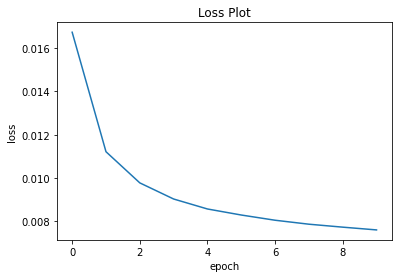

In [45]:
plt.plot(history.history['loss'])
plt.title('Loss Plot')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.show()

### Show Autoencoder Output

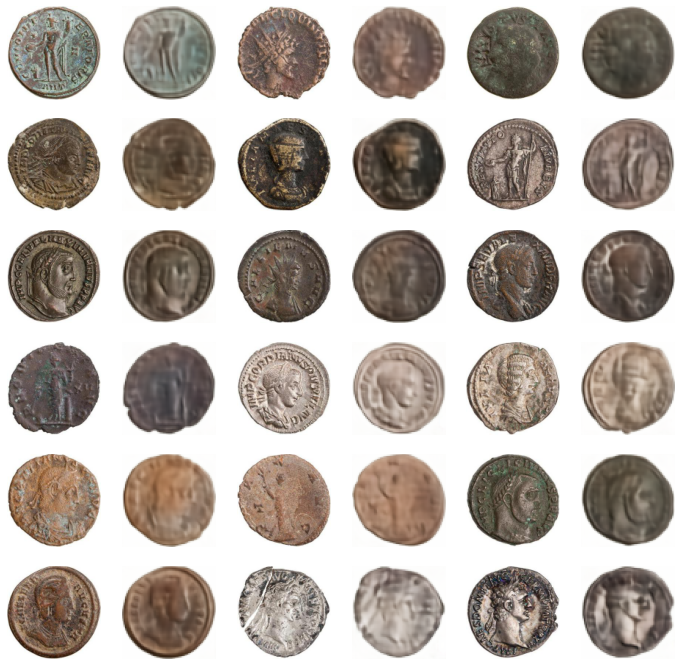

In [46]:
num_examples = 18

def alternate(arr1, arr2):
  combined = []
  for el1, el2 in zip(arr1, arr2):
    combined += [el1, el2]
  return combined

X = []
while len(X) < num_examples:
  X += list(dataset.next()[0])

X = X[:num_examples]
results = autoencoder.predict(np.array(X))

display_image_grid(alternate(X, results))

### Save Encoder

In [47]:
encoder.save('rc_encoder')

INFO:tensorflow:Assets written to: rc_encoder\assets


# K-means Clustering

### Load Encoder

In [ ]:
encoder = models.load_model('encoder')

### Load Unshuffled Dataset

In [48]:
batch_size = 2048
img_dim = 128
channels = 3
img_shape = (img_dim, img_dim, channels)

datagen = preprocessing.image.ImageDataGenerator(
  preprocessing_function=lambda x: x / 255.0,
)

dataset = datagen.flow_from_directory(
  dataset_dir,
  target_size=(img_dim, img_dim),
  batch_size=batch_size,
  interpolation='box',
  shuffle=False
)

Found 82135 images belonging to 1 classes.


### Get Latent Vectors

In [49]:
latents = []
for _ in range(len(dataset)):
  batch, _ = dataset.next()
  batch_latents = encoder.predict(batch).reshape(-1, 4 * 4 * 256)
  latents += list(batch_latents)
latents = np.array(latents)

### Run PCA on Latent Vectors

In [50]:
num_components = 512

pca = PCA(num_components)
latents_pca = pca.fit_transform(latents)

np.sum(pca.explained_variance_ratio_)

0.9255915123436536

### Run K-means Clustering on Latent PCA Vectors

In [51]:
num_clusters = 20

kmeans = KMeans(n_clusters=num_clusters, random_state=1234).fit(latents_pca)
latent_labels = kmeans.predict(latents_pca)

### Plot Cluster Sizes

<BarContainer object of 20 artists>

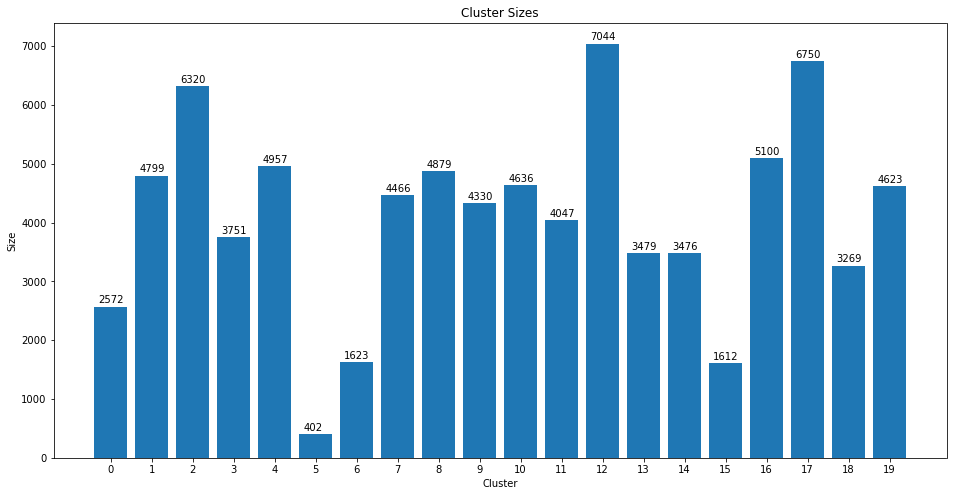

In [52]:
cluster_counts = Counter()
for label in latent_labels:
  cluster_counts[label] += 1

plt.figure(figsize=(16, 8))
plt.title('Cluster Sizes')
plt.xlabel('Cluster')
plt.ylabel('Size')
for label in range(num_clusters):
  plt.text(label - 0.3, cluster_counts[label] + 60, cluster_counts[label])

plt.xticks(list(cluster_counts.keys()))
plt.bar(cluster_counts.keys(), cluster_counts.values())

### Display Images from Each Cluster

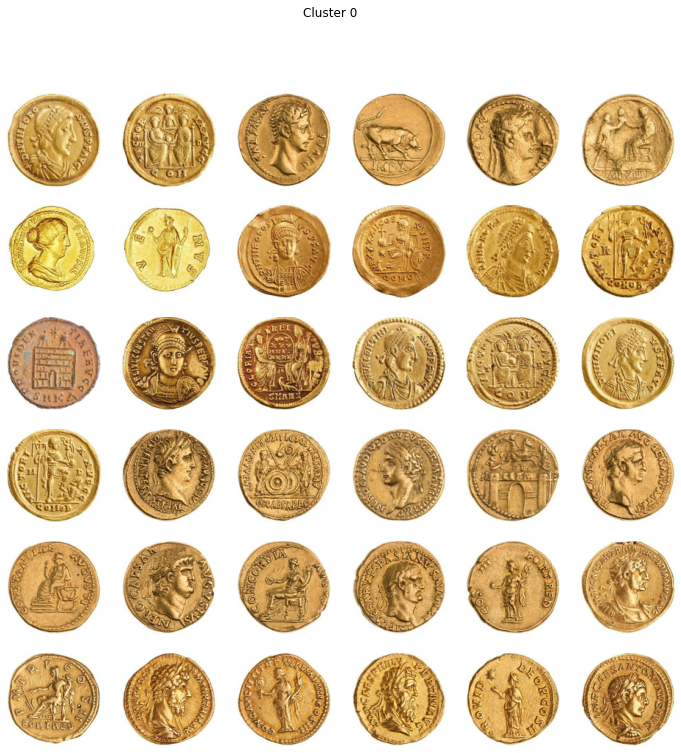

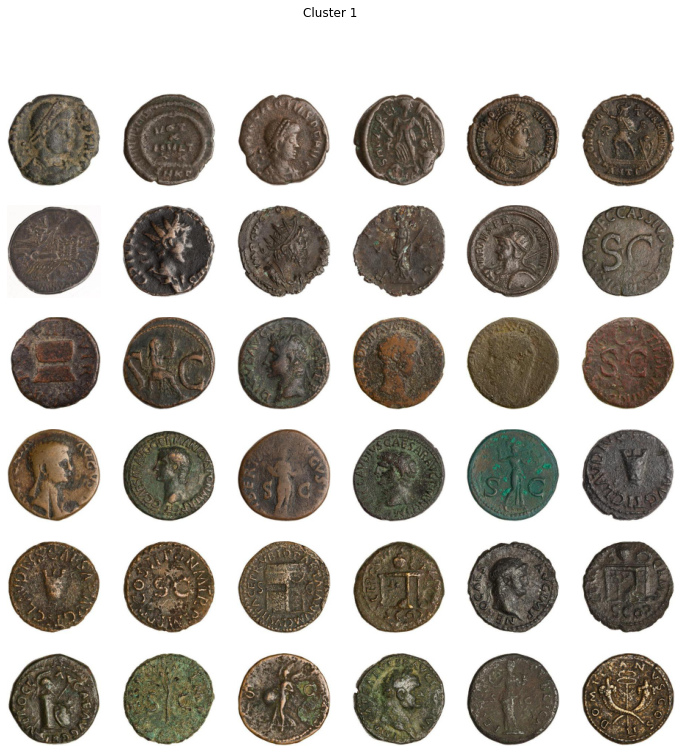

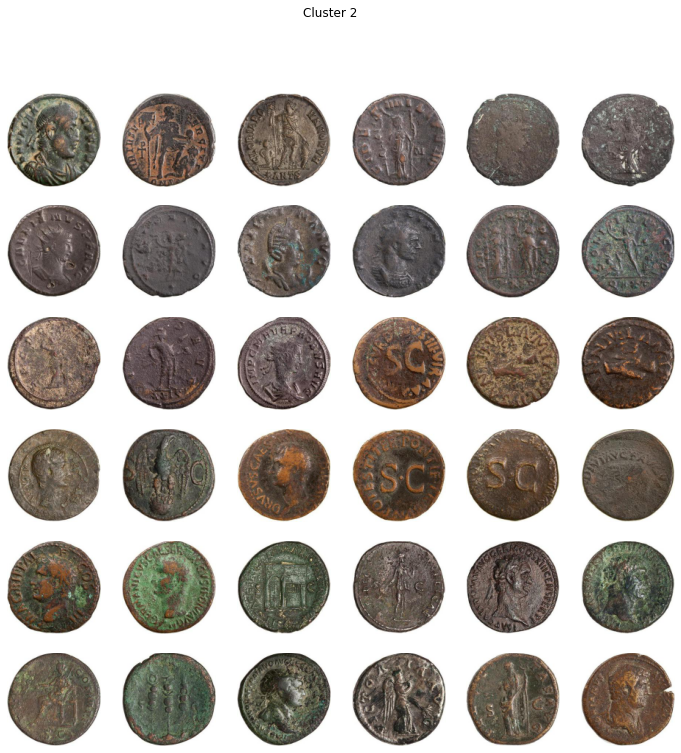

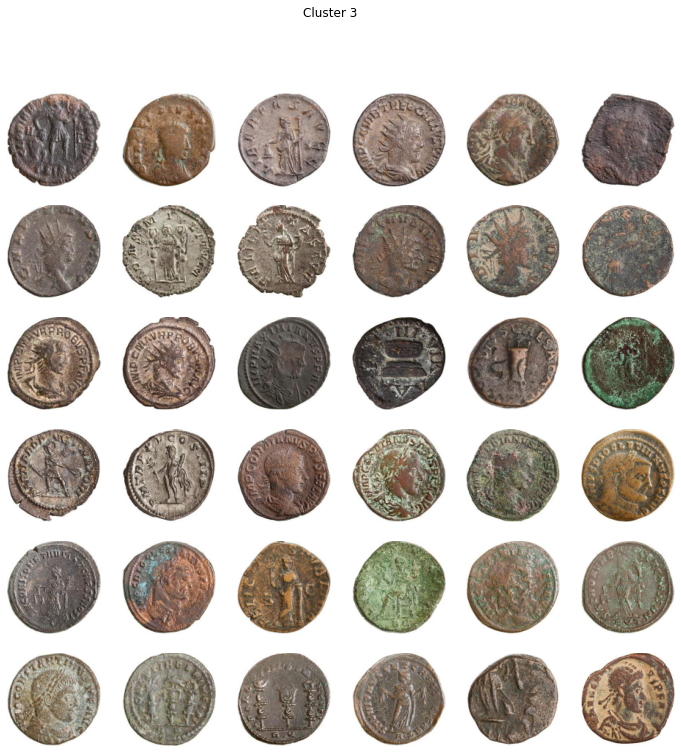

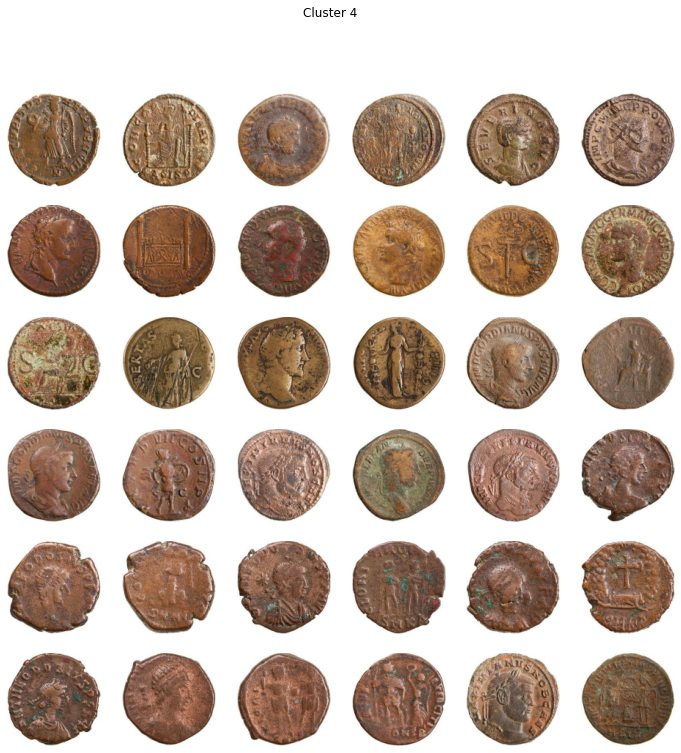

...

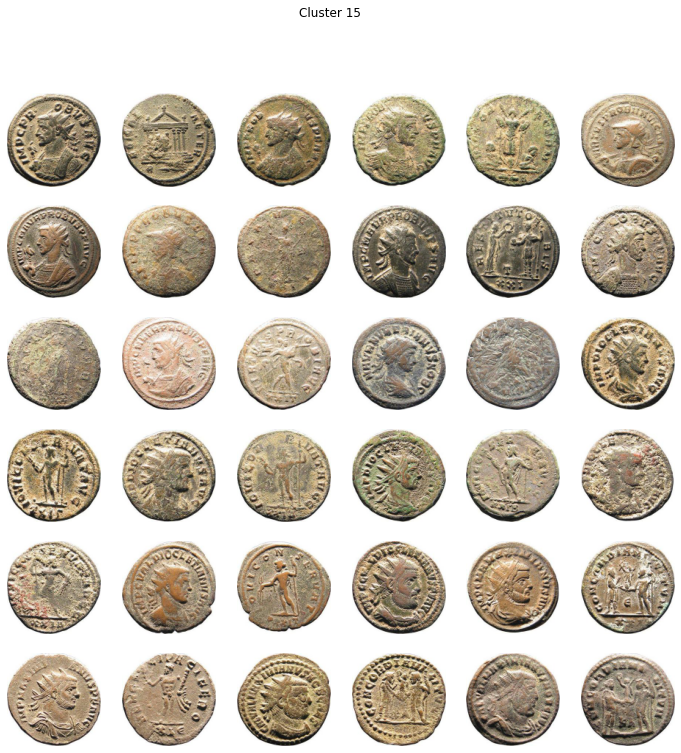

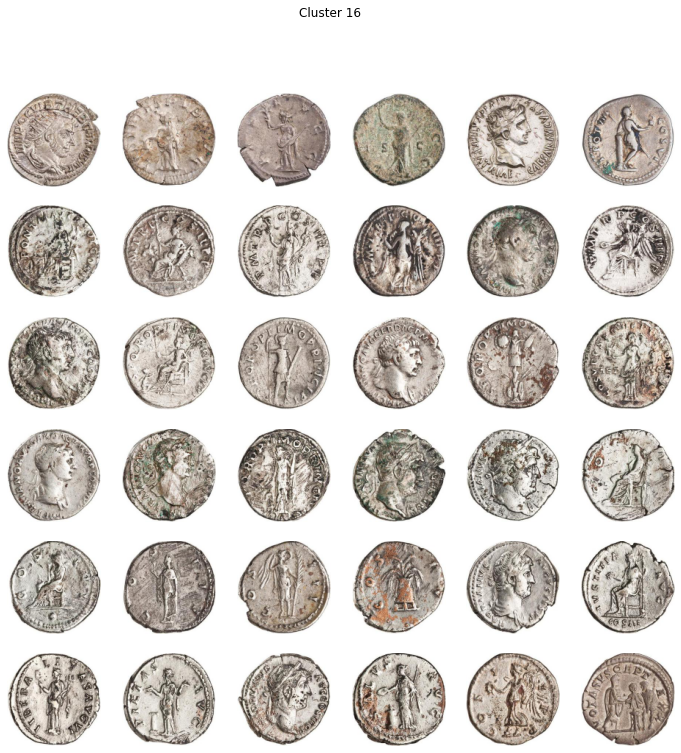

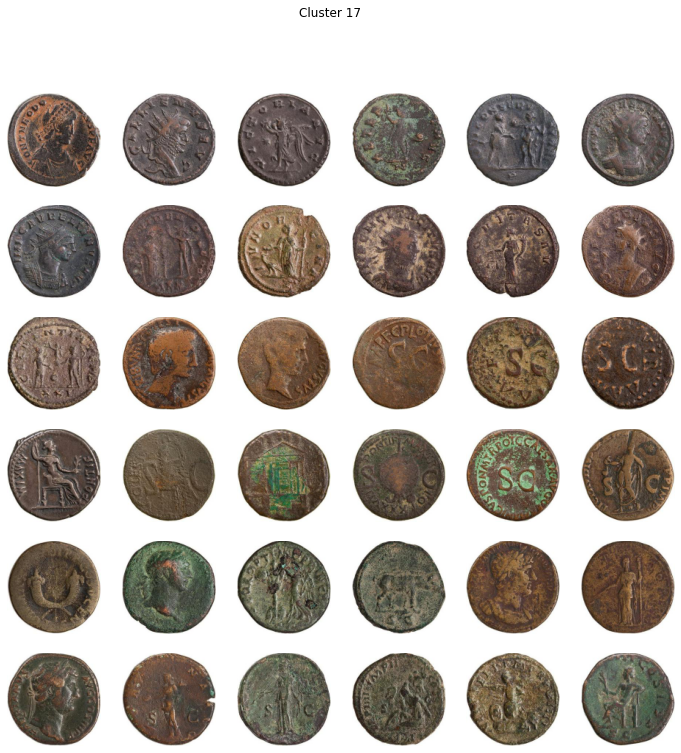

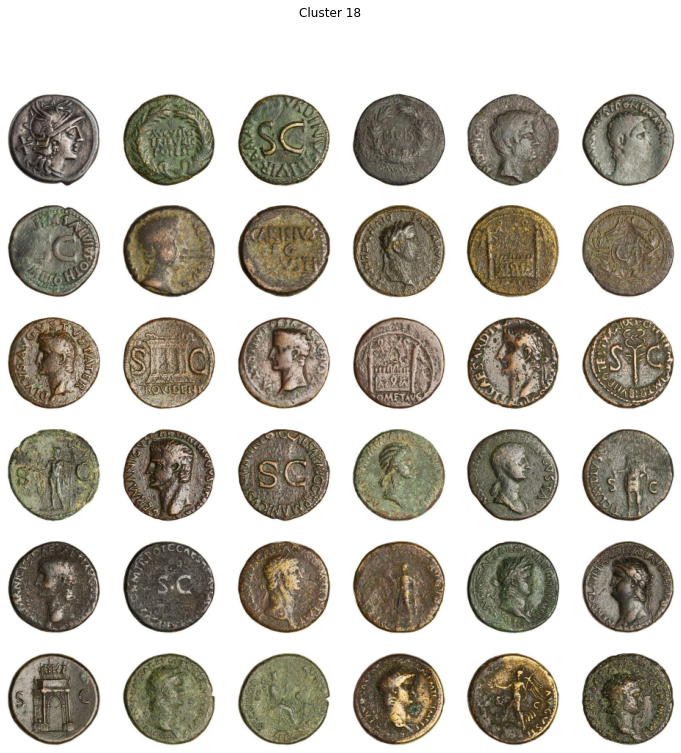

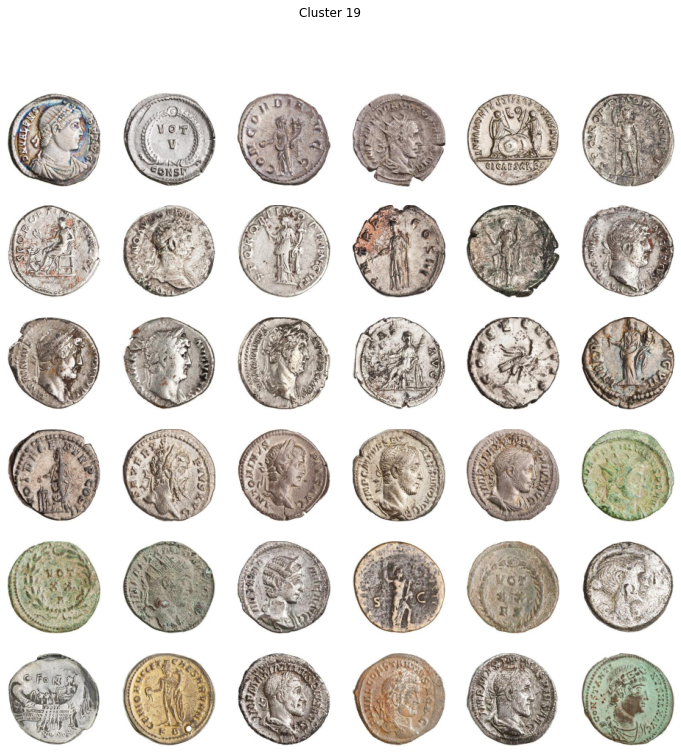

In [53]:
images_per_class = 36

images_by_class = {i: [] for i in range(num_clusters)}

def examples_retrieved():
  for images in images_by_class.values():
    if len(images) < images_per_class:
      return False
  return True

for _ in range(len(dataset)):
  batch, _ = dataset.next()
  latent_batch = encoder.predict(batch).reshape(-1, 4 * 4 * 256)
  latent_batch_pca = pca.transform(latent_batch)
  labels = kmeans.predict(latent_batch_pca)
  for image, label in zip(batch, labels):
    images_by_class[label].append(image)
  if examples_retrieved():
    break

for label in range(num_clusters):
  index = 0
  fig = plt.figure(figsize=(12, 12))
  fig.suptitle(f'Cluster {label}')
  for i in range(images_per_class):
    grid_size = int(np.ceil(np.sqrt(images_per_class)))
    plt.subplot(grid_size, grid_size, i + 1)
    plt.axis('off')
    plt.imshow(images_by_class[label][i])
  plt.show()

### Create Clustered Dataset

In [54]:
output_folder = f'{dataset_dir}_clustered'

if not os.path.isdir(output_folder):
  os.mkdir(output_folder)

class_index = Counter()
for i, filepath in enumerate(dataset.filepaths):
  label = latent_labels[i]
  label_str = str(label).zfill(len(str(num_clusters - 1)))
  image_num = str(class_index[label]).zfill(len(str(cluster_counts[label] - 1)))
  class_index[label] += 1
  if not os.path.isdir(f'{output_folder}/cluster{label_str}'):
    os.mkdir(f'{output_folder}/cluster{label_str}')
  shutil.copy(filepath, f'{output_folder}/cluster{label_str}/cluster{label_str}_{image_num}.jpg')